# Semi-supervised learning!

This notebook will help us find new samples to add to our dataset.

In [6]:
import math
import glob

import matplotlib.pyplot as plt
import librosa
import torchaudio
import librosa.display
import pandas as pd
import soundfile as sf

from fastai_audio.audio import *

from fastai.vision import *

In [7]:
# Set a seed for reproducability
torch.manual_seed(0)

from fastai_audio.audio import SpectrogramConfig, AudioConfig

path = Path("output/")

sg_cfg = SpectrogramConfig(
    f_min=200.0,
    f_max=1000.0,
    hop_length=32,
    n_fft=128,
    n_mels=64,
    pad=0,
    win_length=None
)

config = AudioConfig(
    use_spectro=True,
    #delta=True,
    sg_cfg=sg_cfg,
)

al = AudioList.from_folder(path, config=config).split_by_rand_pct(.2, seed=4).label_from_folder()

In [8]:
tfms = None
#tfms = get_spectro_transforms(mask_time=False, mask_freq=True, roll=False, num_rows=12)
tfms = get_spectro_transforms(
    size=(128, 626), # Upscale the spectrograms from 64x313
    mask_frequency=False, # Don't mask frequencies
    mask_time=False # Don't mask time
)
db = al.transform(tfms).databunch(bs=10)

## Load our trained model

In [9]:
from fastai.vision import models

from fastai_audio.audio import *

learn = audio_learner(db, base_arch=models.densenet161)
learn.load("new_spectrograms")
learn.model.eval()

Sequential(
  (0): Sequential(
    (0): Sequential(
      (conv0): Conv2d(1, 96, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (norm0): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu0): ReLU(inplace=True)
      (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (denseblock1): _DenseBlock(
        (denselayer1): _DenseLayer(
          (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu1): ReLU(inplace=True)
          (conv1): Conv2d(96, 192, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (norm2): BatchNorm2d(192, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu2): ReLU(inplace=True)
          (conv2): Conv2d(192, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        )
        (denselayer2): _DenseLayer(
          (norm1): BatchNorm2d(144, eps=1e-05, momentum=0.1, affin

## Sanity check that our model loaded correctly

If the output of the next cell doesn't say "damselfish", our model hasn't loaded correctly :(

In [10]:
# Sanity check that our model can identify samples we trained it on
tmpfile="output/damselfish/10.wav"
item = AudioItem(path=tmpfile)
(category, _, _) = audio_predict(learn, item)
category

Category damselfish

In [11]:
import torchaudio
import pandas as pd
import soundfile as sf
import os

def search_file_for_samples(filepath, model, offset=2):
    df = pd.DataFrame(columns=["start", "end", "filepath"])

    si, ei = torchaudio.info(filepath)
    length = si.length / si.rate

    for i in range(0, 2000, offset):
        end = i + offset

        y, sr = librosa.load(
            filepath,
            sr=5000,
            offset=i,
            duration=2,
        )
        tmpfile = f"potentials/{os.path.basename(filepath)[:-4]}-{i}.wav"
        sf.write(tmpfile, y, 5000)
        item = AudioItem(path=tmpfile)
        category, _, _ = audio_predict(learn, item)
        if str(category) == "damselfish":
            df = df.append([{"start": i, "end": end, "filepath": filepath}])
        else:
            os.remove(tmpfile)
        
    return df

In [12]:
from subprocess import call

def fetch_recording(gs_path):
  return_code = call(["gsutil", "cp", gs_path, "recordings/"])
  print(return_code)

In [13]:
from torchaudio.transforms import MelSpectrogram, AmplitudeToDB, MFCC
from IPython.display import Audio
import ipywidgets as widgets

from os import listdir
from os.path import isfile, join

class ButtonHandler:
  def __init__(self, filepath, type):
    basename = os.path.basename(filepath)

    self.filepath = filepath
    self.destination = f"output/{type}/{basename}"

  def click(self, event):
    print(f"Ok, I'm moving {self.filepath} to {self.destination}")
    os.rename(self.filepath, self.destination)

def show(filepath):
  sig, sr = torchaudio.load(
      filepath,
  )

  mel = MelSpectrogram(
    f_min=200.0,
    f_max=1000.0,
    hop_length=32,
    n_fft=128,
    n_mels=64,
    pad=0,
    win_length=None
  )(sig)

  mel = AmplitudeToDB(top_db=50)(mel)
  mel = mel.detach()

  print(f"File path {filepath}")
  plt.figure(figsize=(10, 14))
  plt.imshow(mel[0,:,:].detach().numpy(), origin="lower")
  plt.show()
  display(Audio(filepath))
  damsel_button = widgets.Button(
      description='damselfish',
      layout={'width': '150px'},
  )
  d = ButtonHandler(filepath, "damselfish")
  damsel_button.on_click(d.click)
  noise_button = widgets.Button(
      description='noise',
      layout={'width': '150px'},
  )
  n = ButtonHandler(filepath, "noise")
  noise_button.on_click(n.click)
  box = widgets.HBox(children=[damsel_button, noise_button])
  display(box)

# Here is where you fetch a new recording

Change the filename variable in the next cell to select a new file.
Running the cell after that will fetch the file, search the file
for samples and show the potentials.

**This can take some time**

In [14]:
filename = "20151028-180505.wav"

0
File path /home/jupyter/potentials/20151028-180505-1034.wav


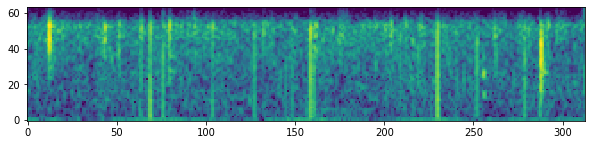

File path /home/jupyter/potentials/20151028-180505-1048.wav


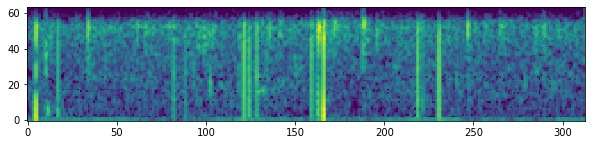

File path /home/jupyter/potentials/20151028-180505-1056.wav


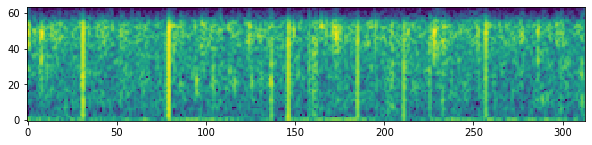

File path /home/jupyter/potentials/20151028-180505-106.wav


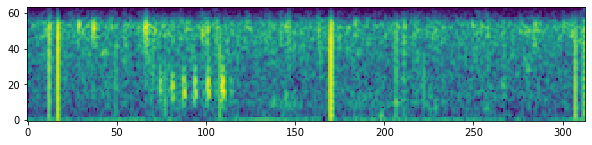

File path /home/jupyter/potentials/20151028-180505-1066.wav


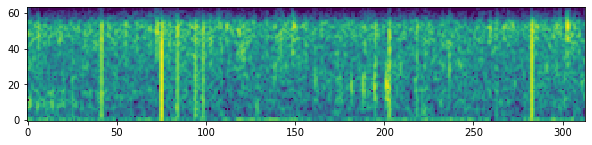

File path /home/jupyter/potentials/20151028-180505-108.wav


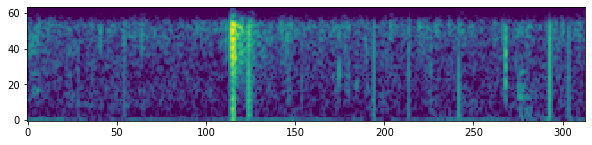

File path /home/jupyter/potentials/20151028-180505-1084.wav


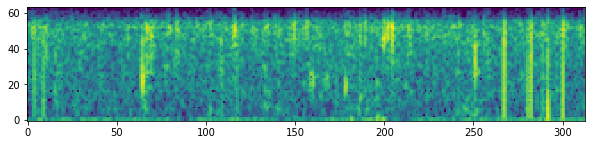

File path /home/jupyter/potentials/20151028-180505-1088.wav


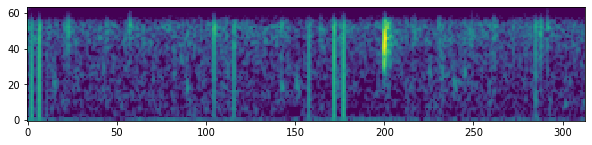

File path /home/jupyter/potentials/20151028-180505-1112.wav


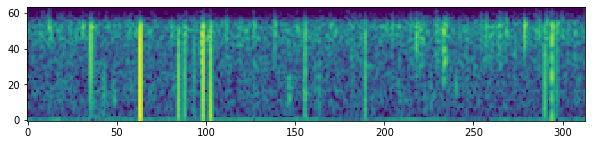

File path /home/jupyter/potentials/20151028-180505-1130.wav


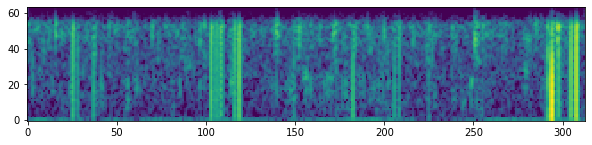

File path /home/jupyter/potentials/20151028-180505-1140.wav


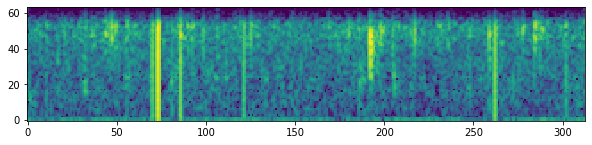

File path /home/jupyter/potentials/20151028-180505-1146.wav


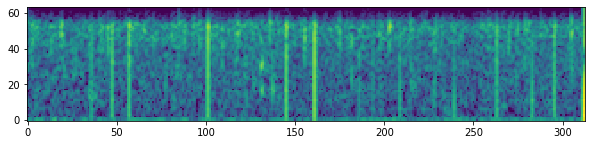

File path /home/jupyter/potentials/20151028-180505-1148.wav


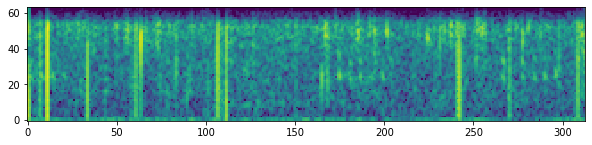

File path /home/jupyter/potentials/20151028-180505-1154.wav


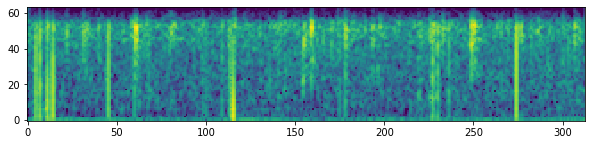

File path /home/jupyter/potentials/20151028-180505-1166.wav


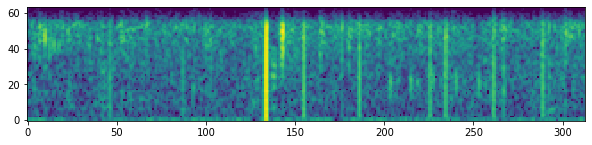

File path /home/jupyter/potentials/20151028-180505-1172.wav


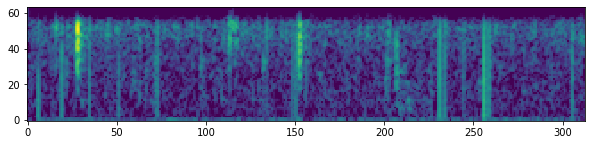

File path /home/jupyter/potentials/20151028-180505-1174.wav


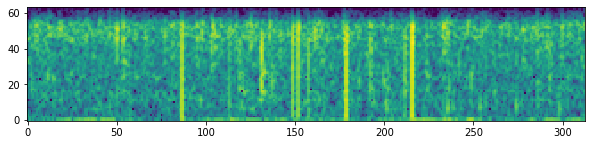

File path /home/jupyter/potentials/20151028-180505-118.wav


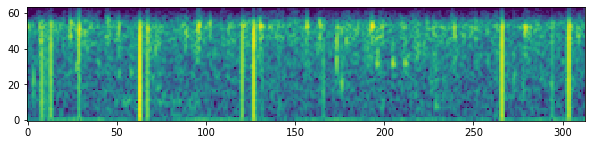

File path /home/jupyter/potentials/20151028-180505-1194.wav


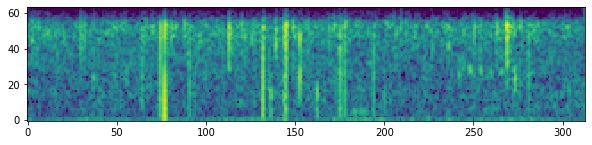

File path /home/jupyter/potentials/20151028-180505-12.wav


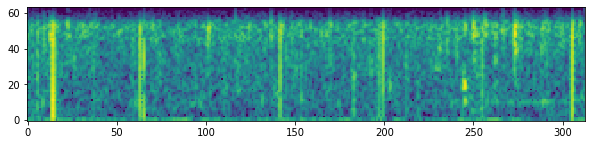

File path /home/jupyter/potentials/20151028-180505-1200.wav


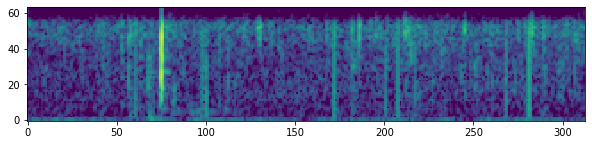

File path /home/jupyter/potentials/20151028-180505-1226.wav


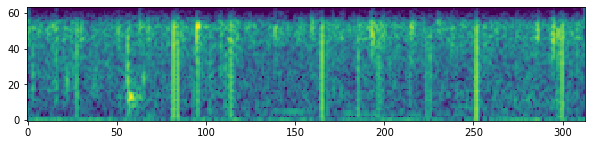

File path /home/jupyter/potentials/20151028-180505-1256.wav


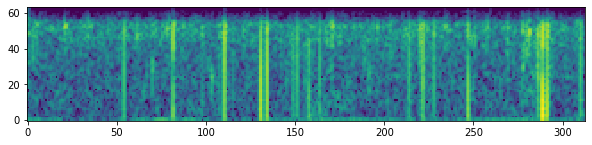

File path /home/jupyter/potentials/20151028-180505-126.wav


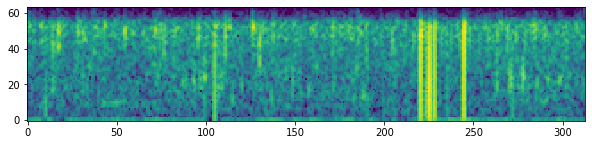

File path /home/jupyter/potentials/20151028-180505-1264.wav


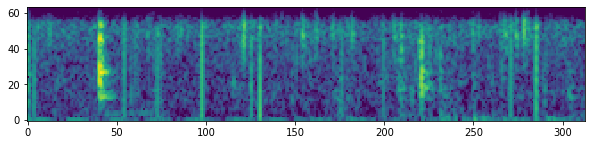

File path /home/jupyter/potentials/20151028-180505-1298.wav


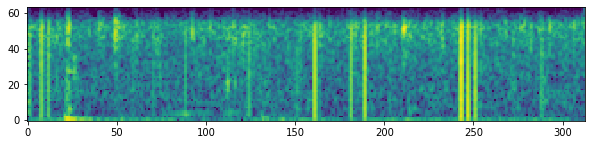

File path /home/jupyter/potentials/20151028-180505-1318.wav


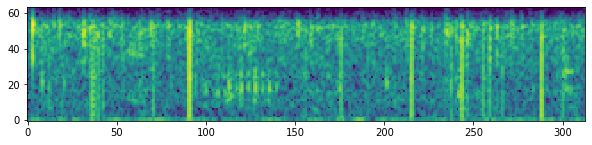

File path /home/jupyter/potentials/20151028-180505-1332.wav


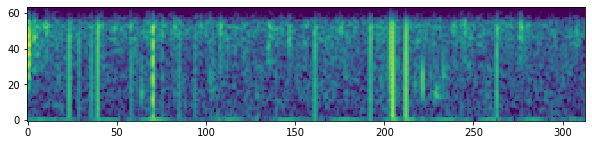

File path /home/jupyter/potentials/20151028-180505-1336.wav


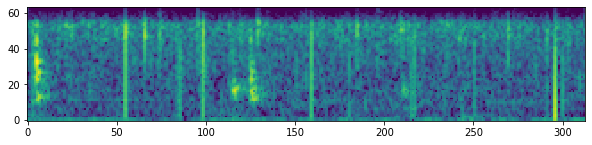

File path /home/jupyter/potentials/20151028-180505-1338.wav


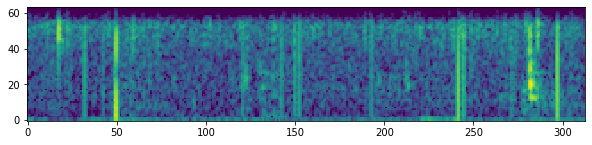

File path /home/jupyter/potentials/20151028-180505-1344.wav


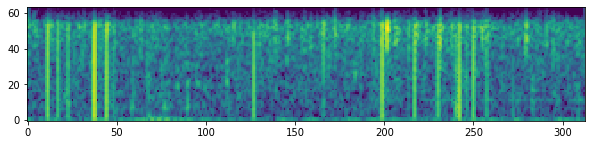

File path /home/jupyter/potentials/20151028-180505-1378.wav


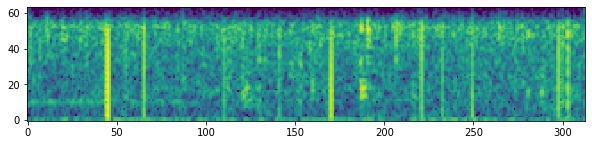

File path /home/jupyter/potentials/20151028-180505-1382.wav


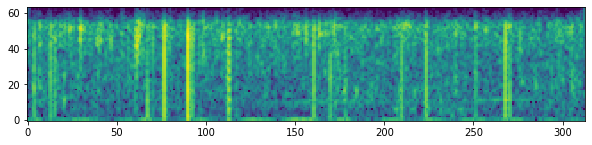

File path /home/jupyter/potentials/20151028-180505-1394.wav


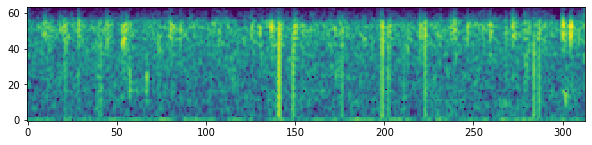

File path /home/jupyter/potentials/20151028-180505-1396.wav


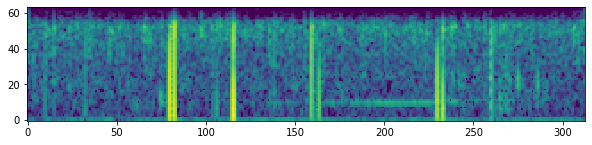

File path /home/jupyter/potentials/20151028-180505-1412.wav


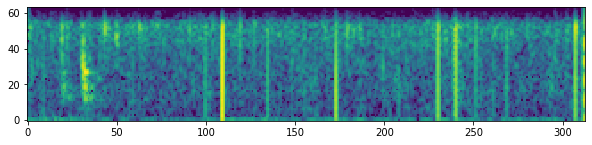

File path /home/jupyter/potentials/20151028-180505-1422.wav


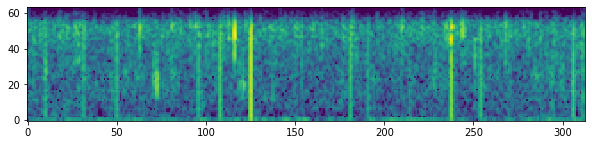

File path /home/jupyter/potentials/20151028-180505-1428.wav


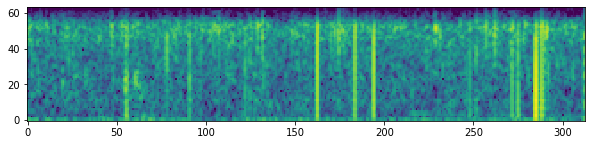

File path /home/jupyter/potentials/20151028-180505-146.wav


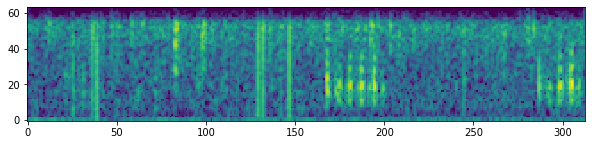

File path /home/jupyter/potentials/20151028-180505-1460.wav


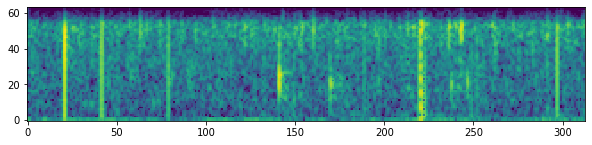

File path /home/jupyter/potentials/20151028-180505-1480.wav


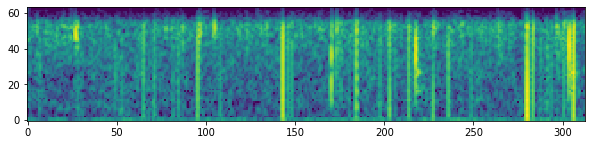

File path /home/jupyter/potentials/20151028-180505-1500.wav


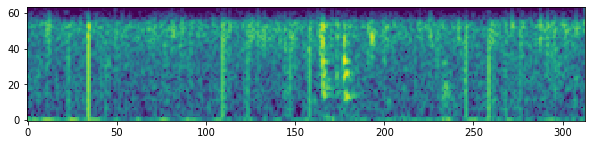

File path /home/jupyter/potentials/20151028-180505-1510.wav


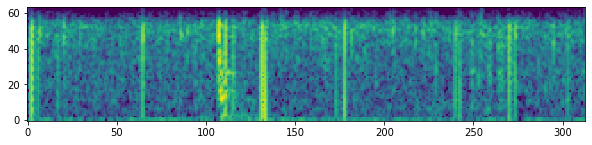

File path /home/jupyter/potentials/20151028-180505-152.wav


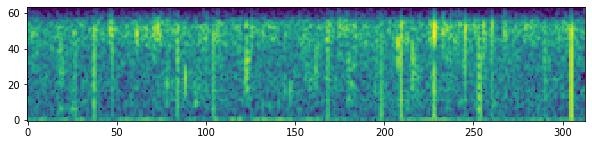

File path /home/jupyter/potentials/20151028-180505-1524.wav


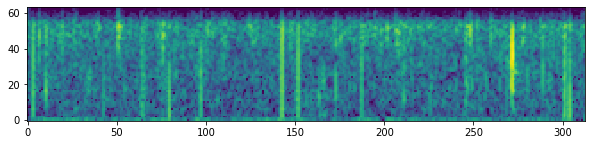

File path /home/jupyter/potentials/20151028-180505-1530.wav


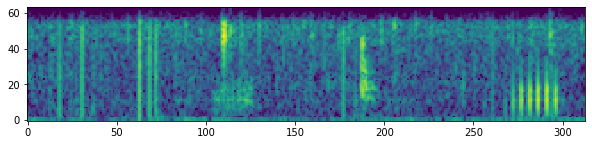

File path /home/jupyter/potentials/20151028-180505-1540.wav


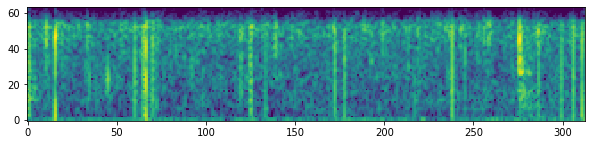

File path /home/jupyter/potentials/20151028-180505-1546.wav


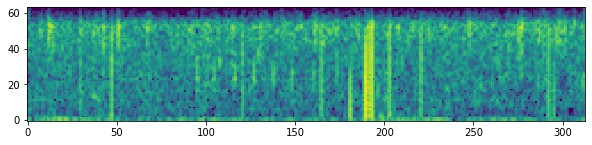

File path /home/jupyter/potentials/20151028-180505-1554.wav


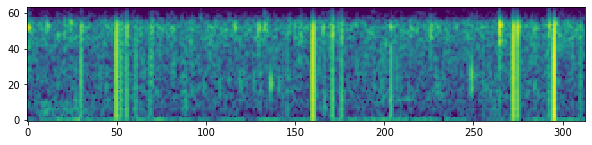

File path /home/jupyter/potentials/20151028-180505-1556.wav


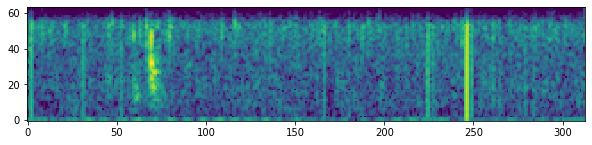

File path /home/jupyter/potentials/20151028-180505-1560.wav


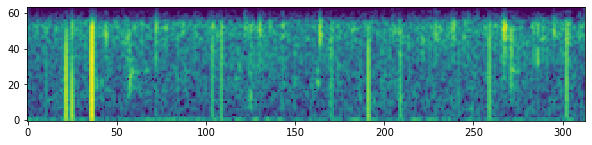

File path /home/jupyter/potentials/20151028-180505-1570.wav


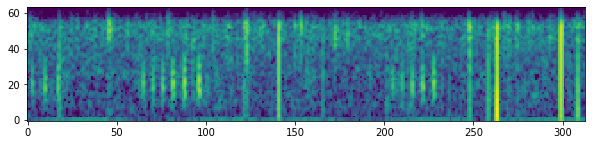

File path /home/jupyter/potentials/20151028-180505-1572.wav


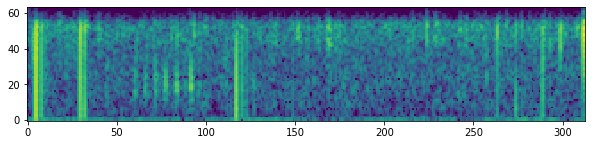

File path /home/jupyter/potentials/20151028-180505-1576.wav


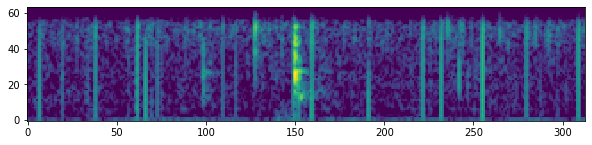

File path /home/jupyter/potentials/20151028-180505-1596.wav


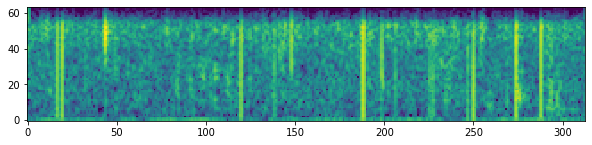

File path /home/jupyter/potentials/20151028-180505-1636.wav


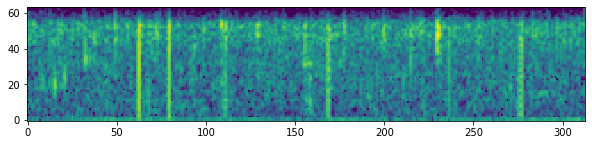

File path /home/jupyter/potentials/20151028-180505-1644.wav


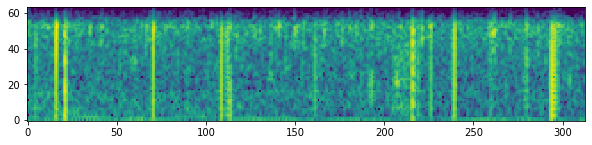

File path /home/jupyter/potentials/20151028-180505-1646.wav


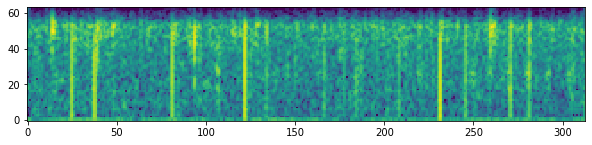

File path /home/jupyter/potentials/20151028-180505-1654.wav


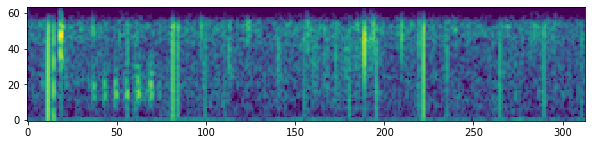

File path /home/jupyter/potentials/20151028-180505-1664.wav


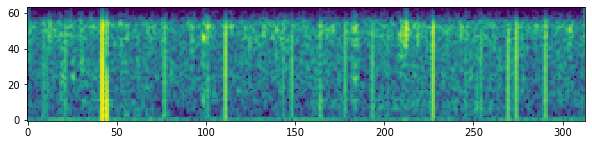

File path /home/jupyter/potentials/20151028-180505-1670.wav


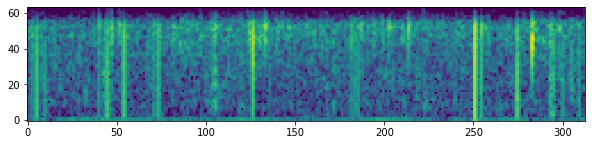

File path /home/jupyter/potentials/20151028-180505-1676.wav


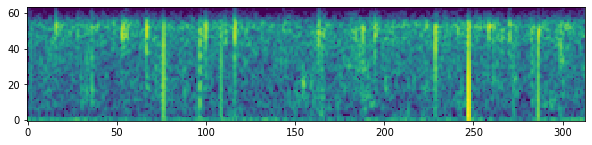

File path /home/jupyter/potentials/20151028-180505-1686.wav


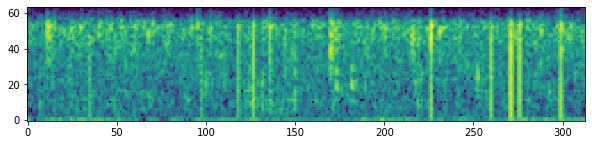

File path /home/jupyter/potentials/20151028-180505-1690.wav


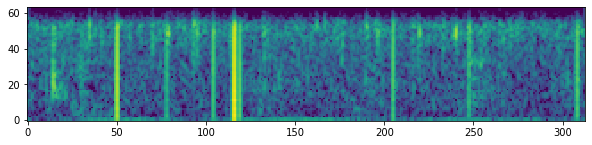

File path /home/jupyter/potentials/20151028-180505-1694.wav


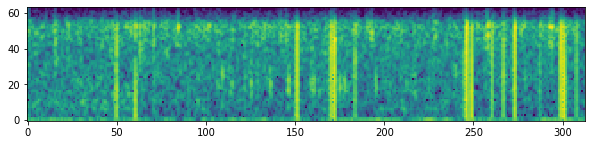

File path /home/jupyter/potentials/20151028-180505-1710.wav


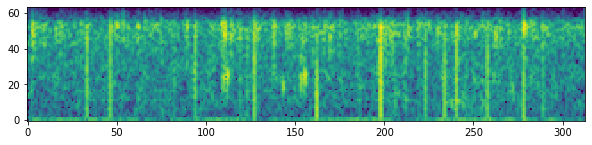

File path /home/jupyter/potentials/20151028-180505-1712.wav


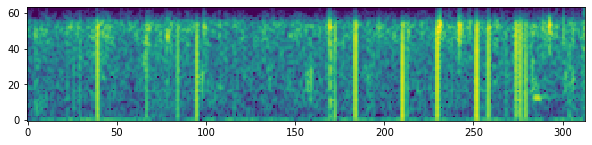

File path /home/jupyter/potentials/20151028-180505-1722.wav


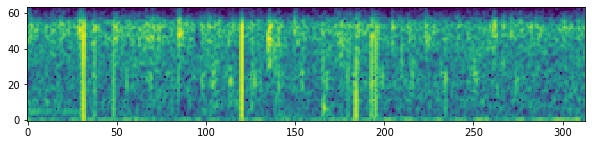

File path /home/jupyter/potentials/20151028-180505-1728.wav


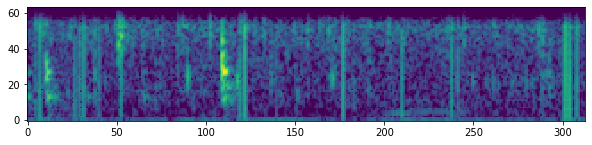

File path /home/jupyter/potentials/20151028-180505-1734.wav


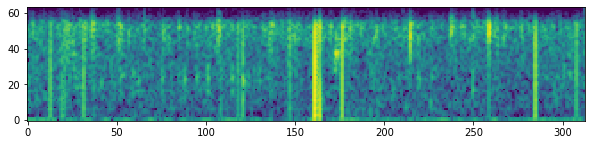

File path /home/jupyter/potentials/20151028-180505-174.wav


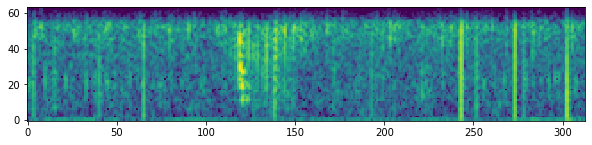

File path /home/jupyter/potentials/20151028-180505-1748.wav


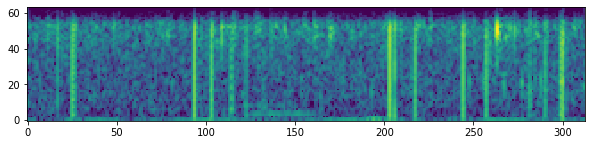

File path /home/jupyter/potentials/20151028-180505-1752.wav


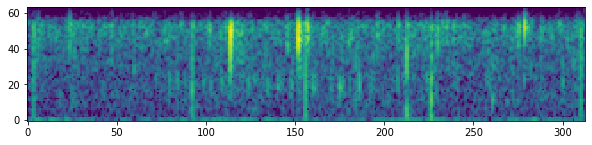

File path /home/jupyter/potentials/20151028-180505-1754.wav


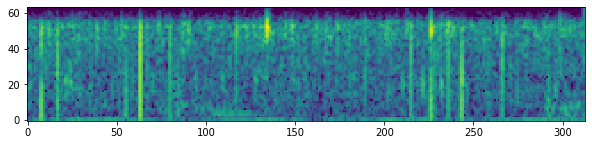

File path /home/jupyter/potentials/20151028-180505-1760.wav


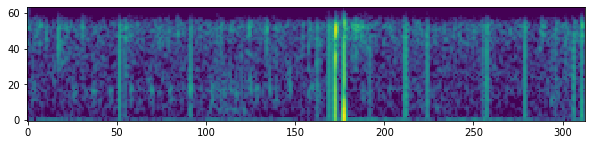

File path /home/jupyter/potentials/20151028-180505-1762.wav


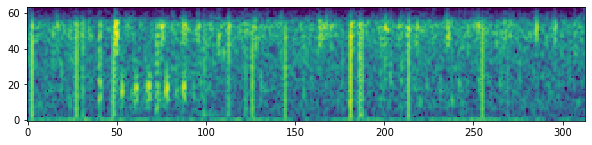

File path /home/jupyter/potentials/20151028-180505-1766.wav


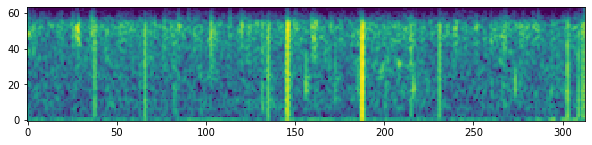

File path /home/jupyter/potentials/20151028-180505-1768.wav


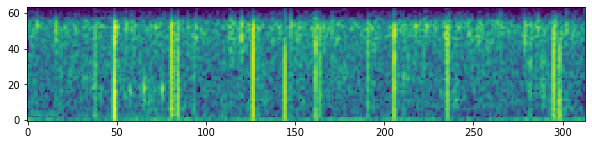

File path /home/jupyter/potentials/20151028-180505-1770.wav


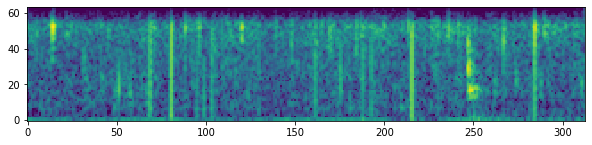

File path /home/jupyter/potentials/20151028-180505-1784.wav


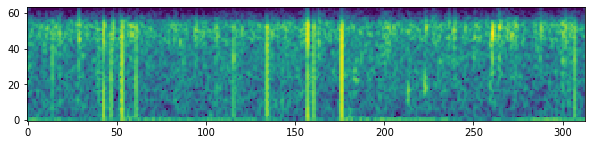

File path /home/jupyter/potentials/20151028-180505-1786.wav


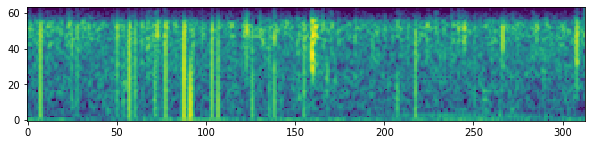

File path /home/jupyter/potentials/20151028-180505-180.wav


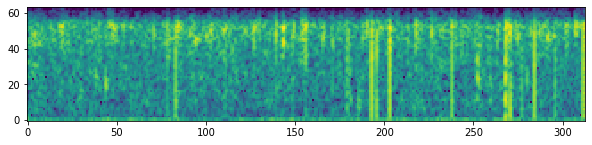

File path /home/jupyter/potentials/20151028-180505-1808.wav


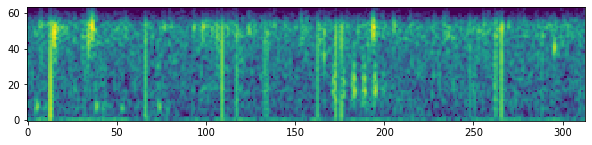

File path /home/jupyter/potentials/20151028-180505-1810.wav


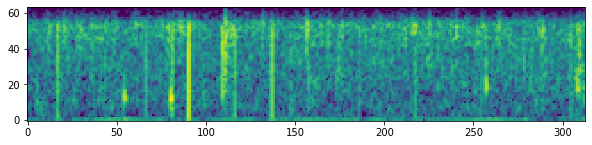

File path /home/jupyter/potentials/20151028-180505-1832.wav


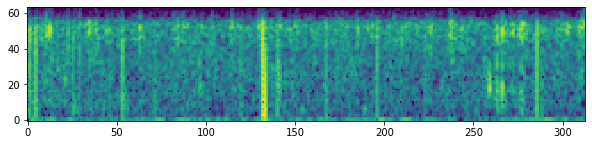

File path /home/jupyter/potentials/20151028-180505-184.wav


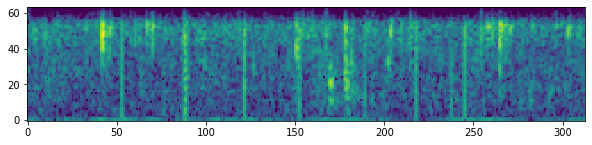

File path /home/jupyter/potentials/20151028-180505-186.wav


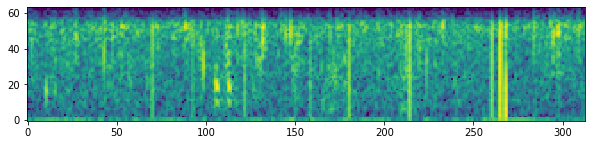

File path /home/jupyter/potentials/20151028-180505-1860.wav


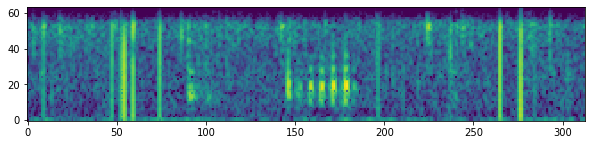

File path /home/jupyter/potentials/20151028-180505-1870.wav


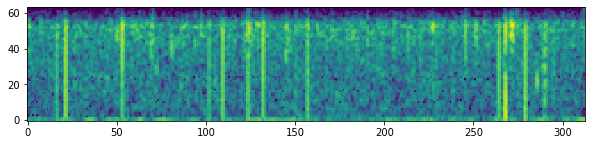

File path /home/jupyter/potentials/20151028-180505-1888.wav


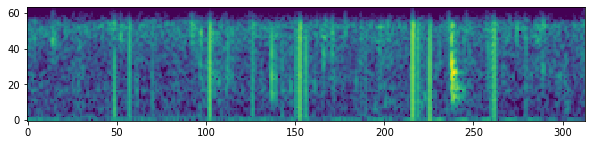

File path /home/jupyter/potentials/20151028-180505-1896.wav


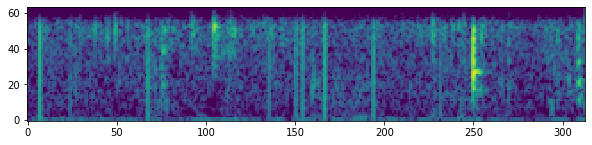

File path /home/jupyter/potentials/20151028-180505-1902.wav


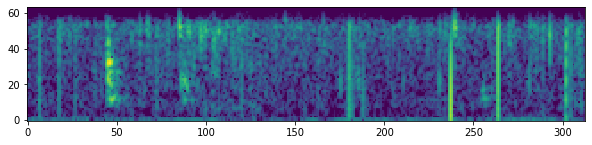

File path /home/jupyter/potentials/20151028-180505-1916.wav


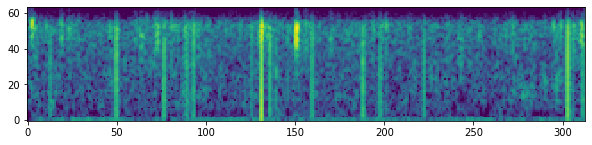

File path /home/jupyter/potentials/20151028-180505-194.wav


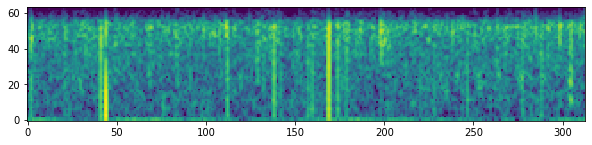

File path /home/jupyter/potentials/20151028-180505-1946.wav


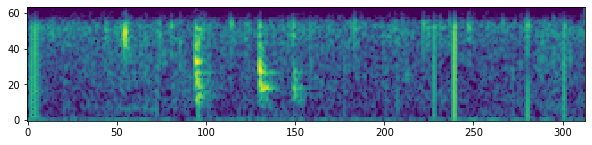

File path /home/jupyter/potentials/20151028-180505-1950.wav


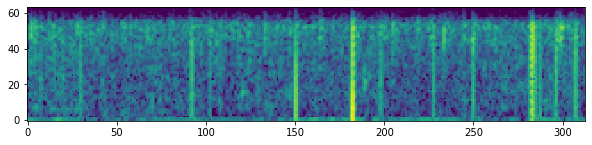

File path /home/jupyter/potentials/20151028-180505-196.wav


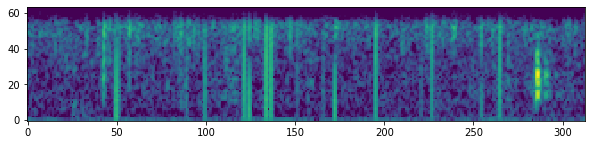

File path /home/jupyter/potentials/20151028-180505-1960.wav


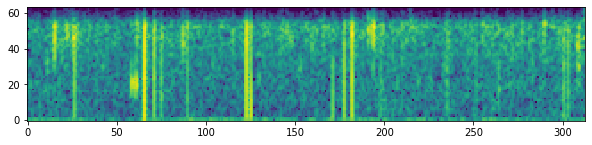

File path /home/jupyter/potentials/20151028-180505-1980.wav


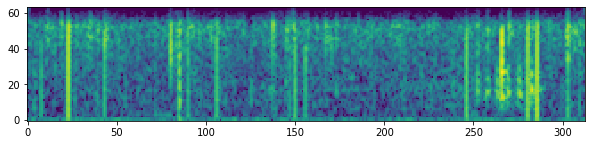

File path /home/jupyter/potentials/20151028-180505-202.wav


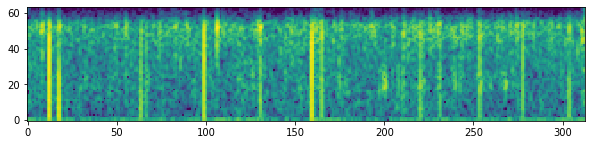

File path /home/jupyter/potentials/20151028-180505-210.wav


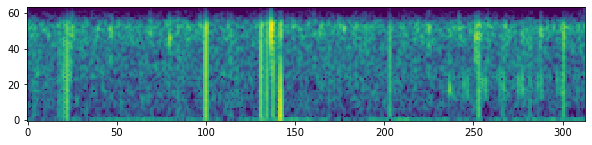

File path /home/jupyter/potentials/20151028-180505-212.wav


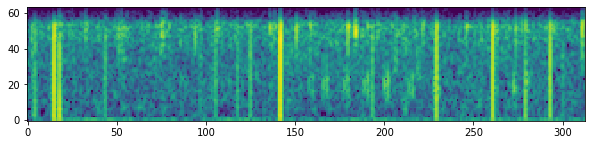

File path /home/jupyter/potentials/20151028-180505-218.wav


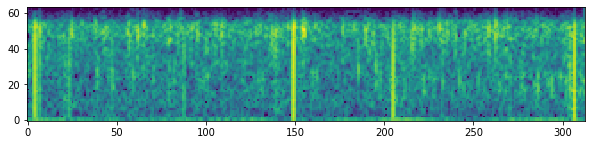

File path /home/jupyter/potentials/20151028-180505-220.wav


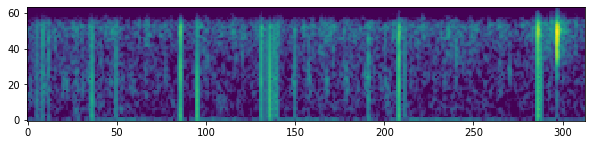

File path /home/jupyter/potentials/20151028-180505-240.wav


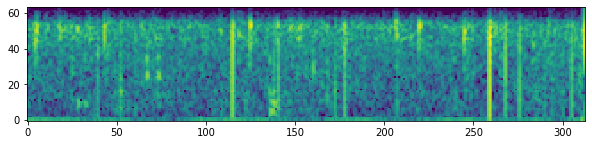

File path /home/jupyter/potentials/20151028-180505-246.wav


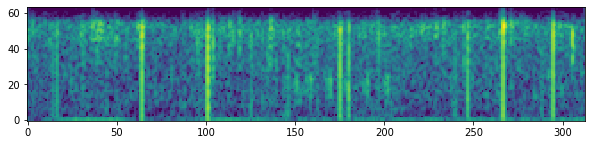

File path /home/jupyter/potentials/20151028-180505-252.wav


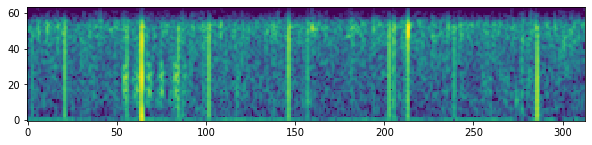

File path /home/jupyter/potentials/20151028-180505-260.wav


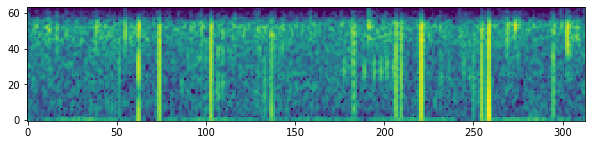

File path /home/jupyter/potentials/20151028-180505-272.wav


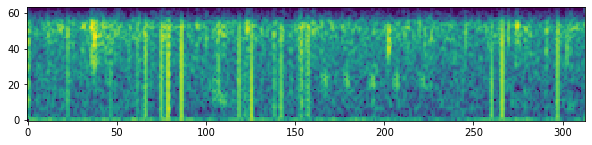

File path /home/jupyter/potentials/20151028-180505-298.wav


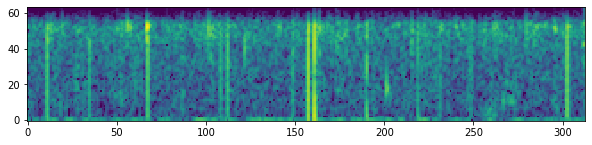

File path /home/jupyter/potentials/20151028-180505-30.wav


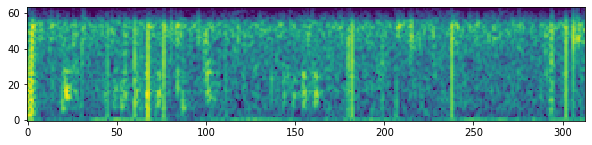

File path /home/jupyter/potentials/20151028-180505-314.wav


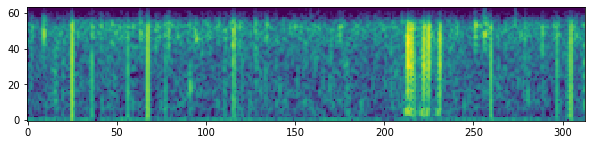

File path /home/jupyter/potentials/20151028-180505-336.wav


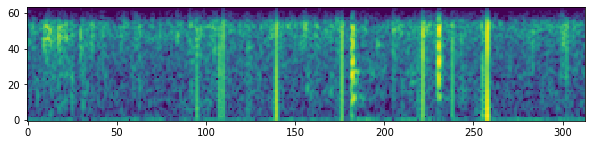

File path /home/jupyter/potentials/20151028-180505-342.wav


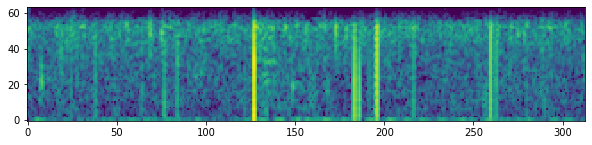

File path /home/jupyter/potentials/20151028-180505-344.wav


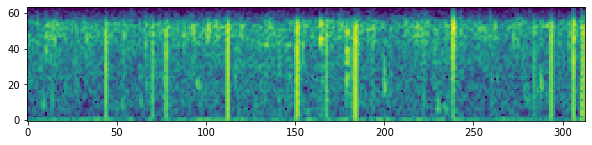

File path /home/jupyter/potentials/20151028-180505-348.wav


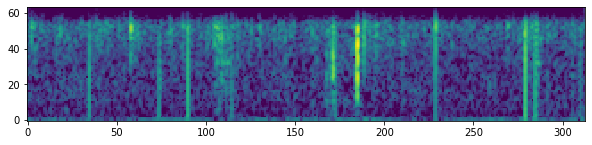

File path /home/jupyter/potentials/20151028-180505-350.wav


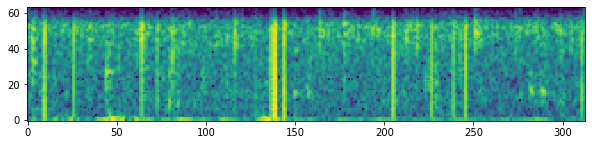

File path /home/jupyter/potentials/20151028-180505-364.wav


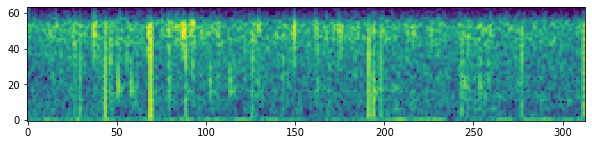

File path /home/jupyter/potentials/20151028-180505-370.wav


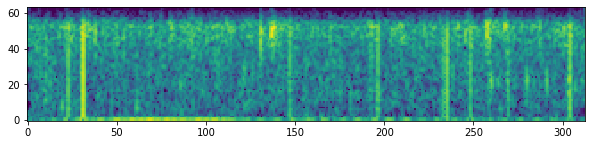

File path /home/jupyter/potentials/20151028-180505-372.wav


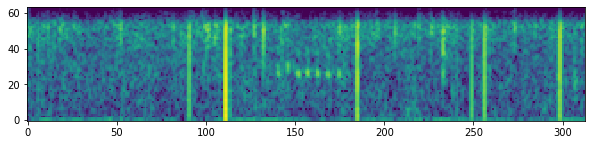

File path /home/jupyter/potentials/20151028-180505-374.wav


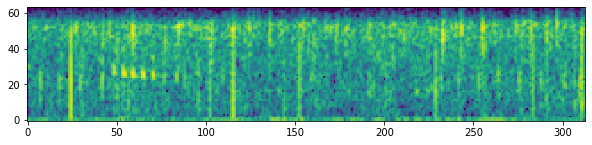

File path /home/jupyter/potentials/20151028-180505-388.wav


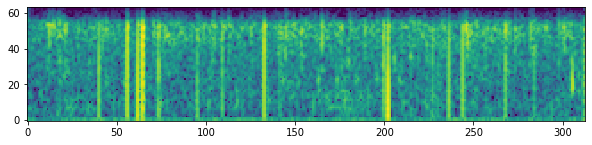

File path /home/jupyter/potentials/20151028-180505-400.wav


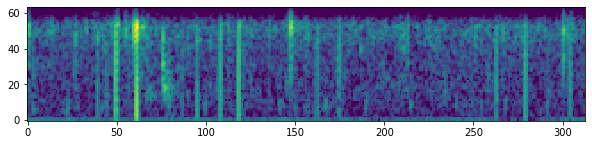

File path /home/jupyter/potentials/20151028-180505-418.wav


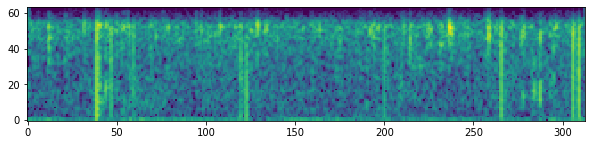

File path /home/jupyter/potentials/20151028-180505-420.wav


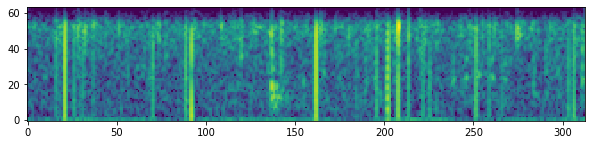

File path /home/jupyter/potentials/20151028-180505-424.wav


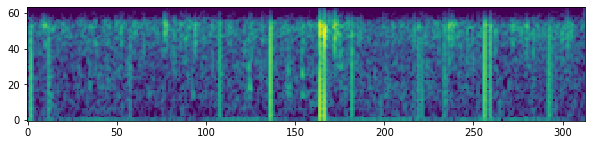

File path /home/jupyter/potentials/20151028-180505-430.wav


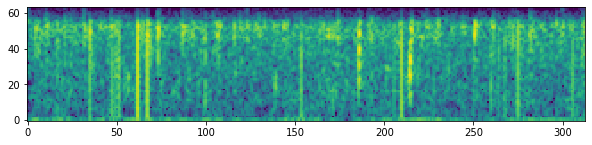

File path /home/jupyter/potentials/20151028-180505-446.wav


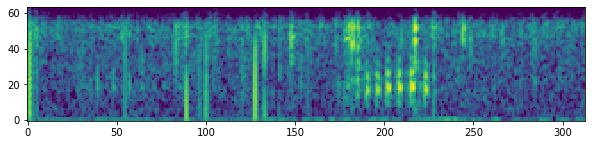

File path /home/jupyter/potentials/20151028-180505-448.wav


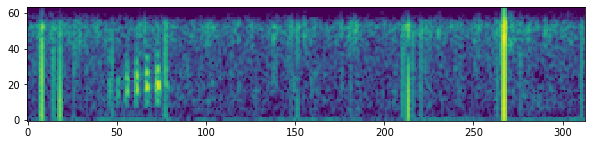

File path /home/jupyter/potentials/20151028-180505-46.wav


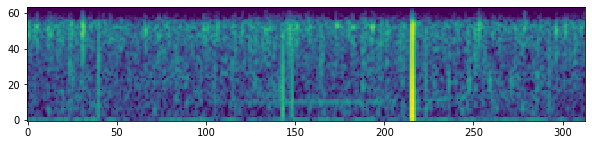

File path /home/jupyter/potentials/20151028-180505-482.wav


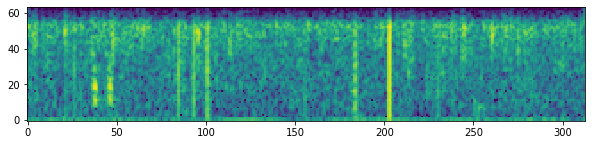

File path /home/jupyter/potentials/20151028-180505-502.wav


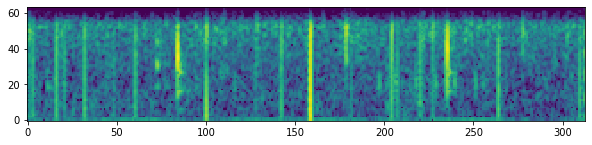

File path /home/jupyter/potentials/20151028-180505-506.wav


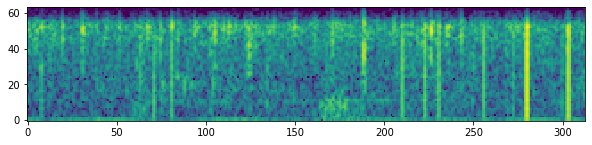

File path /home/jupyter/potentials/20151028-180505-514.wav


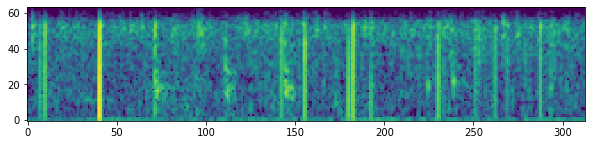

File path /home/jupyter/potentials/20151028-180505-516.wav


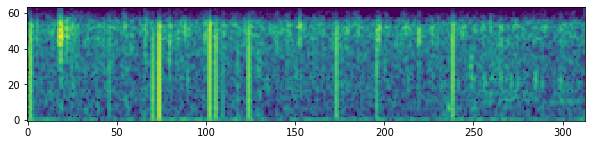

File path /home/jupyter/potentials/20151028-180505-520.wav


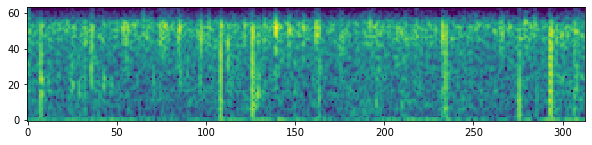

File path /home/jupyter/potentials/20151028-180505-528.wav


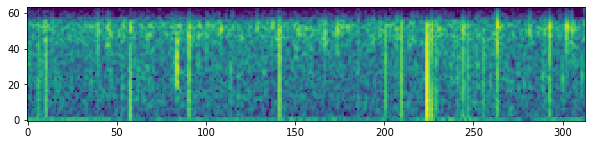

File path /home/jupyter/potentials/20151028-180505-532.wav


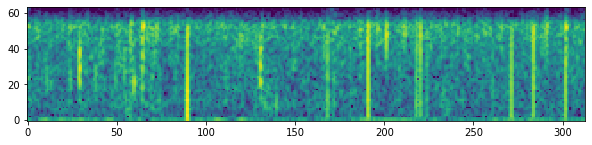

File path /home/jupyter/potentials/20151028-180505-534.wav


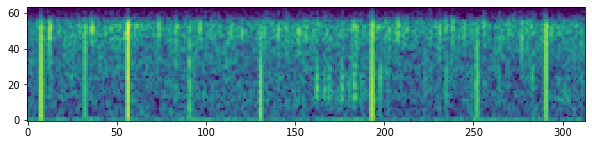

File path /home/jupyter/potentials/20151028-180505-540.wav


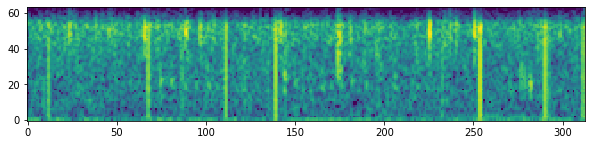

File path /home/jupyter/potentials/20151028-180505-542.wav


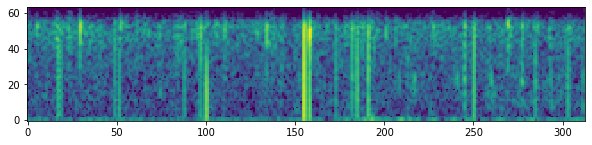

File path /home/jupyter/potentials/20151028-180505-546.wav


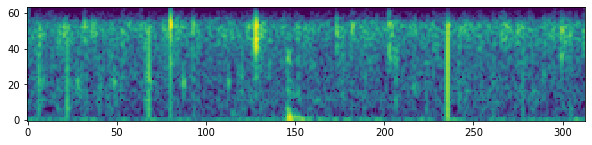

File path /home/jupyter/potentials/20151028-180505-56.wav


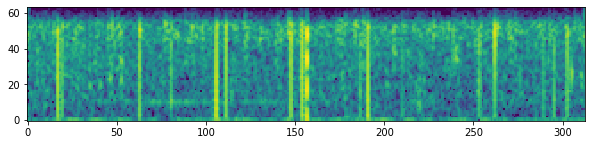

File path /home/jupyter/potentials/20151028-180505-576.wav


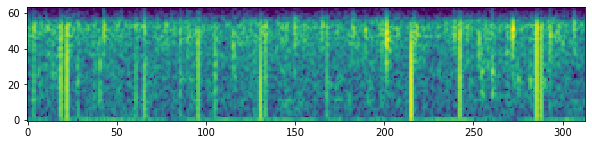

File path /home/jupyter/potentials/20151028-180505-584.wav


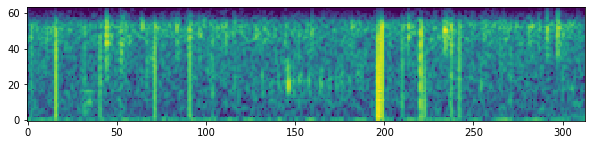

File path /home/jupyter/potentials/20151028-180505-626.wav


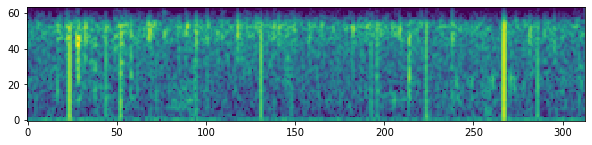

File path /home/jupyter/potentials/20151028-180505-628.wav


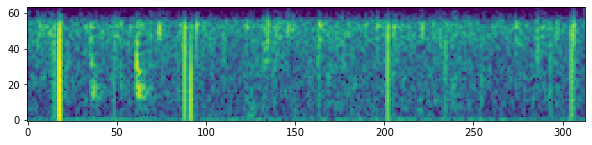

File path /home/jupyter/potentials/20151028-180505-646.wav


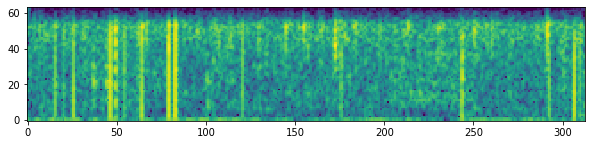

File path /home/jupyter/potentials/20151028-180505-66.wav


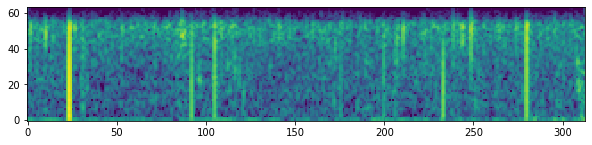

File path /home/jupyter/potentials/20151028-180505-664.wav


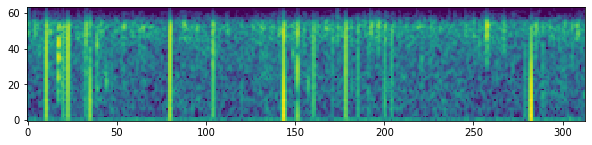

File path /home/jupyter/potentials/20151028-180505-666.wav


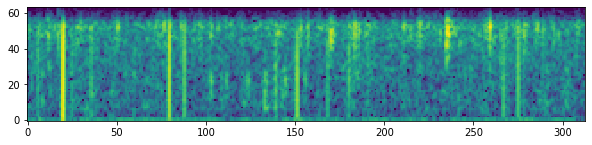

File path /home/jupyter/potentials/20151028-180505-670.wav


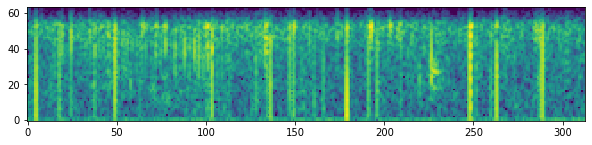

File path /home/jupyter/potentials/20151028-180505-672.wav


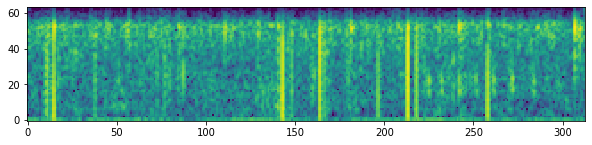

File path /home/jupyter/potentials/20151028-180505-686.wav


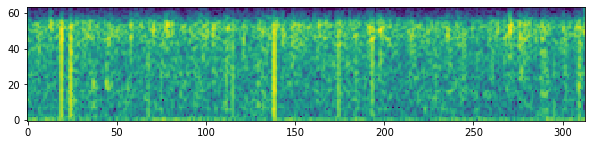

File path /home/jupyter/potentials/20151028-180505-692.wav


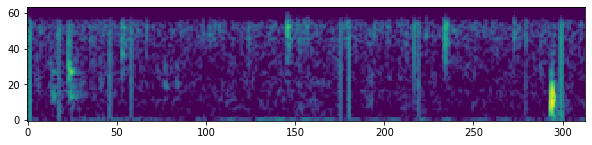

File path /home/jupyter/potentials/20151028-180505-694.wav


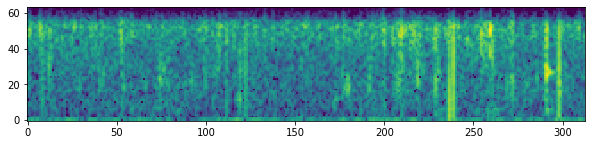

File path /home/jupyter/potentials/20151028-180505-704.wav


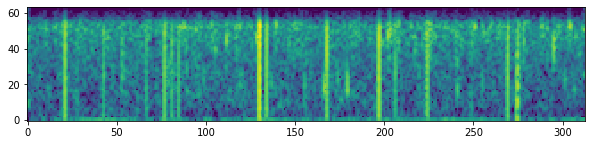

File path /home/jupyter/potentials/20151028-180505-710.wav


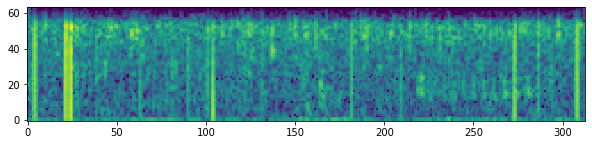

File path /home/jupyter/potentials/20151028-180505-72.wav


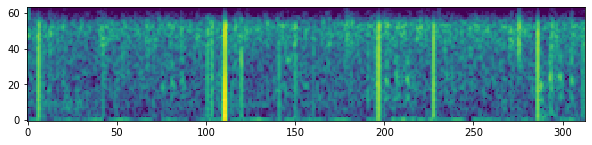

File path /home/jupyter/potentials/20151028-180505-734.wav


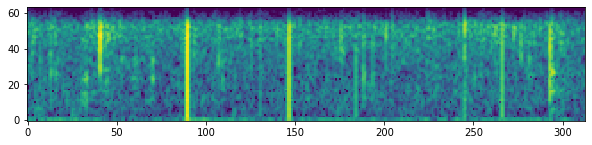

File path /home/jupyter/potentials/20151028-180505-738.wav


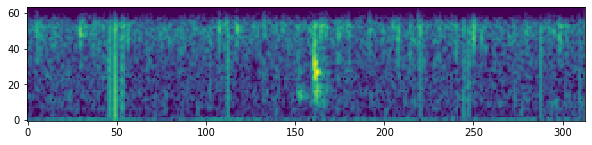

File path /home/jupyter/potentials/20151028-180505-744.wav


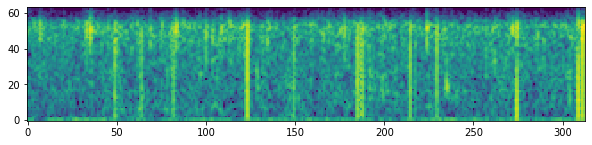

File path /home/jupyter/potentials/20151028-180505-756.wav


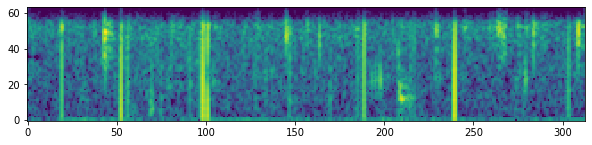

File path /home/jupyter/potentials/20151028-180505-768.wav


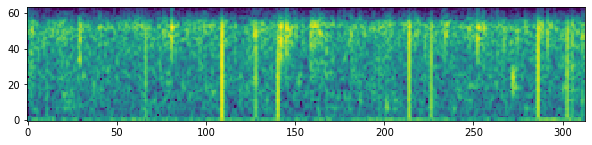

File path /home/jupyter/potentials/20151028-180505-770.wav


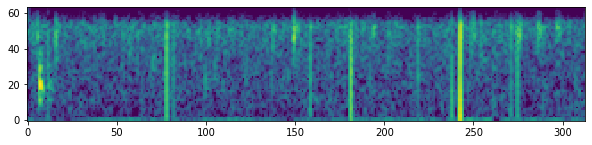

File path /home/jupyter/potentials/20151028-180505-792.wav


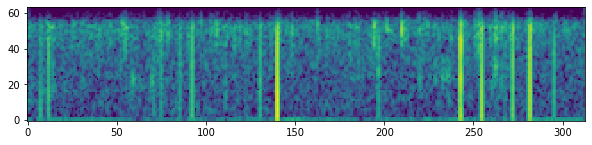

File path /home/jupyter/potentials/20151028-180505-80.wav


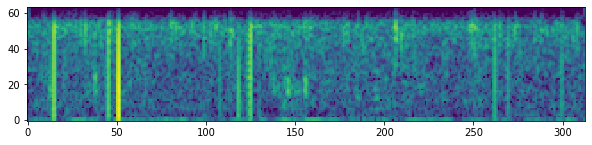

File path /home/jupyter/potentials/20151028-180505-82.wav


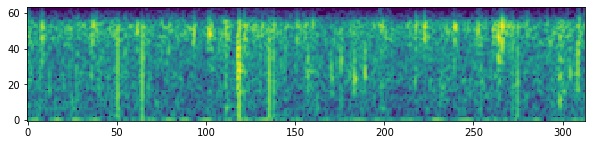

File path /home/jupyter/potentials/20151028-180505-828.wav


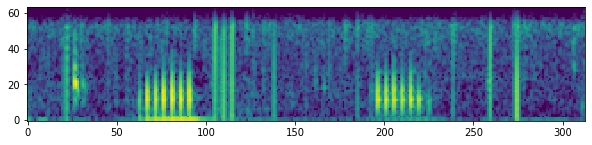

File path /home/jupyter/potentials/20151028-180505-830.wav


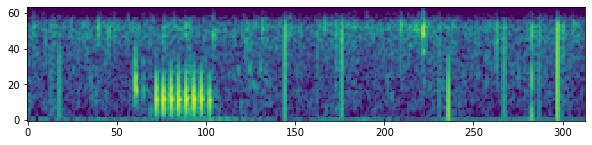

File path /home/jupyter/potentials/20151028-180505-836.wav


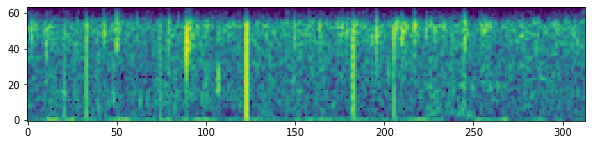

File path /home/jupyter/potentials/20151028-180505-854.wav


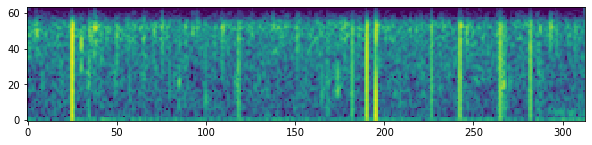

File path /home/jupyter/potentials/20151028-180505-858.wav


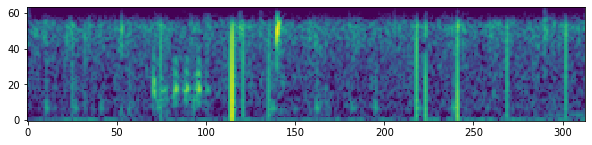

File path /home/jupyter/potentials/20151028-180505-866.wav


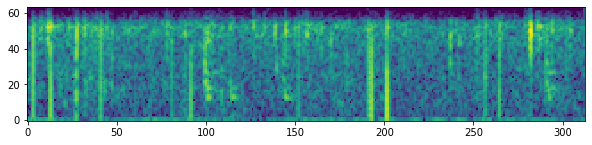

File path /home/jupyter/potentials/20151028-180505-888.wav


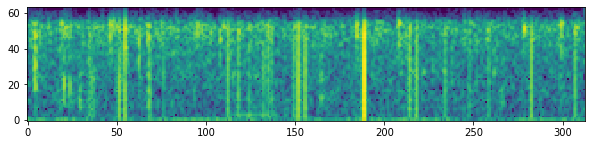

File path /home/jupyter/potentials/20151028-180505-902.wav


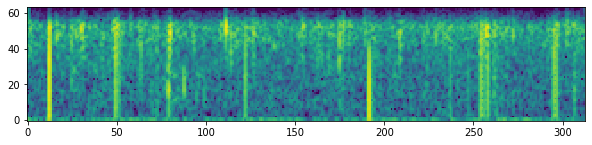

File path /home/jupyter/potentials/20151028-180505-930.wav


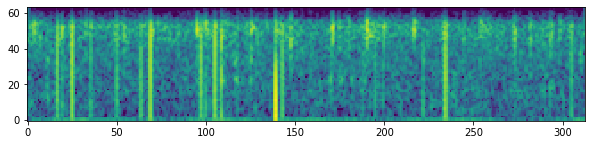

File path /home/jupyter/potentials/20151028-180505-932.wav


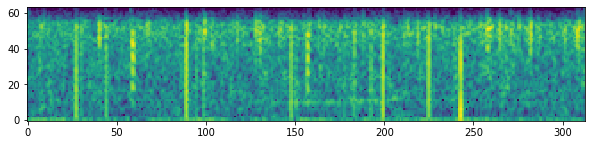

File path /home/jupyter/potentials/20151028-180505-954.wav


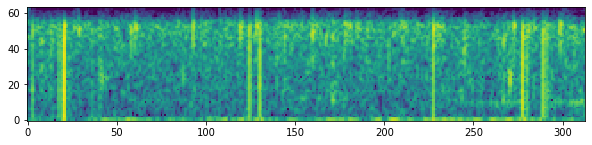

In [15]:
fetch_recording(f"gs://sonumator/recordings/2015-2016/{filename}")
!rm -rf /home/jupyter/potentials/*.wav
df = search_file_for_samples(f"recordings/{filename}", learn)
df.index = range(len(df.index))
mypath = "/home/jupyter/potentials/"
potentials = [f"{mypath}{f}" for f in listdir(mypath) if isfile(join(mypath, f))]
potentials.sort()

for i in range(0, len(potentials)):
  show(potentials[i])